<a href="https://colab.research.google.com/github/wisteria0793/boilerplate/blob/master/bear.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 719 kB 35.0 MB/s 
     |████████████████████████████████| 4.7 MB 58.3 MB/s 
     |████████████████████████████████| 1.2 MB 64.5 MB/s 
     |████████████████████████████████| 365 kB 58.1 MB/s 
     |████████████████████████████████| 101 kB 13.3 MB/s 
     |████████████████████████████████| 212 kB 73.4 MB/s 
     |████████████████████████████████| 115 kB 71.1 MB/s 
     |████████████████████████████████| 141 kB 58.2 MB/s 
     |████████████████████████████████| 596 kB 53.6 MB/s 
     |████████████████████████████████| 127 kB 73.1 MB/s 
     |████████████████████████████████| 6.6 MB 45.5 MB/s 
Mounted at /content/gdrive


In [2]:
from fastbook import *
from fastai.vision.all import *

In [5]:
key = os.environ.get('AZURE_SEARCH_KEY', '3126af22e6b84287895c0d3c4398323d')

In [6]:
search_images_bing

<function fastbook.search_images_bing>

In [7]:
results = search_images_bing(key, 'grezzly bear')
ims = results.attrgot('contentUrl')
len(ims)

150

In [11]:
dest = 'images/grizzly.jpg'
download_url(ims[0], dest)

Path('images/grizzly.jpg')

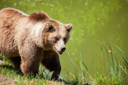

In [13]:
im = Image.open(dest)
im.to_thumb(128, 128)

In [20]:
bear_types = 'grizzly','black','teddy'
path = Path('bears')

In [21]:
if not path.exists():
    path.mkdir()
    for o in bear_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} bear')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [22]:
fns = get_image_files(path)
fns

(#426) [Path('bears/grizzly/c7e7c1b3-8b0b-49f3-a2d2-52c4c7dd3d73.jpg'),Path('bears/grizzly/e515dc89-9c64-41fe-98e5-69dd6668d4e6.jpg'),Path('bears/grizzly/2091a109-fb3a-4c98-9ca8-67e379a806ec.jpg'),Path('bears/grizzly/57f20975-5bc1-484b-89f7-958f18a7b1bf.jpg'),Path('bears/grizzly/10eb96c8-fead-4835-a2b2-51b48ff478d4.jpg'),Path('bears/grizzly/24fcab2a-e8e6-4888-ba5c-ff6f54eb5628.jpg'),Path('bears/grizzly/0be7978a-f868-45da-85ca-e32ab6002400.jpg'),Path('bears/grizzly/8e4112ee-8bef-45a5-bb35-5b2e2cee7b1e.jpg'),Path('bears/grizzly/c20d8e81-e69e-4344-b577-a9c9867ba205.jpg'),Path('bears/grizzly/b91b77ba-27bf-4817-ac29-c6a203397cfe.jpg')...]

In [23]:
failed = verify_images(fns)
failed

(#7) [Path('bears/grizzly/a4a5db78-8aaf-4744-9d2c-4817f5816e34.jpg'),Path('bears/grizzly/b5141697-6a24-4fe8-86fc-cee742d19562.jpg'),Path('bears/grizzly/853d3711-d51f-4ea7-b62a-8fe84c7b0b93.jpg'),Path('bears/teddy/ec8c002b-233f-4955-9a0a-c0066f0bb29b.jpg'),Path('bears/teddy/8822b11f-6936-4526-bd3f-1ecb13369a18.jpg'),Path('bears/teddy/3e870979-89eb-4dba-9a5e-1eb790dcfcd2.jpg'),Path('bears/teddy/d3180516-5365-4a49-a861-84eff5a47743.jpg')]

In [27]:
failed.map(Path.unlink);

In [33]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128)
)

In [34]:
dls = bears.dataloaders(path)

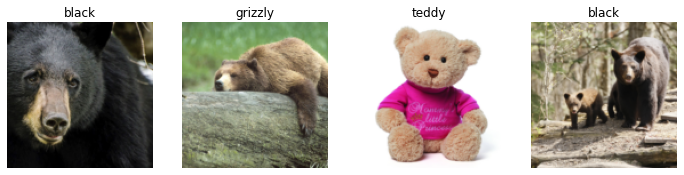

In [35]:
dls.valid.show_batch(max_n=4, nrows=1)

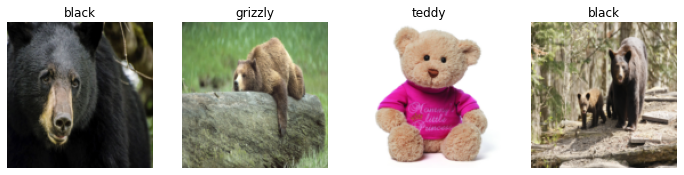

In [36]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

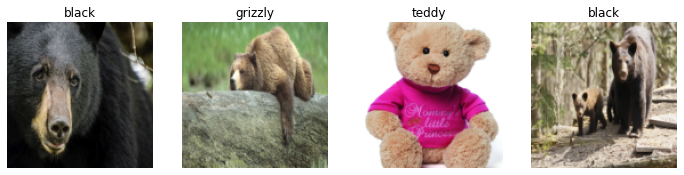

In [37]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

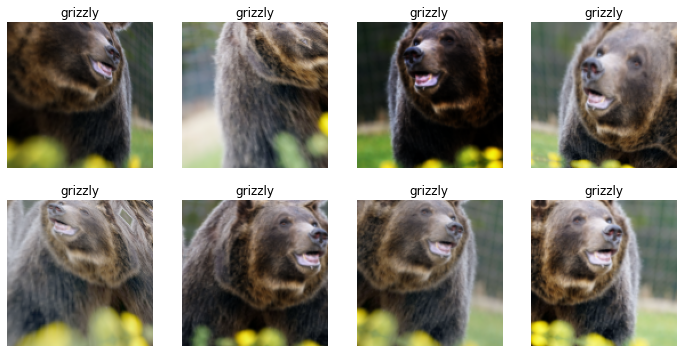

In [38]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [41]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

In [42]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:136: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and will be removed in 0.15. Please use keyword parameter(s) instead.
  f"Using {sequence_to_str(tuple(keyword_only_kwargs.keys()), separate_last='and ')} as positional "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,1.387759,0.058242,0.012048,00:29


epoch,train_loss,valid_loss,error_rate,time
0,0.184612,0.039836,0.012048,00:37
1,0.143041,0.059300,0.012048,00:36
2,0.103101,0.048692,0.012048,00:28
3,0.079160,0.048145,0.012048,00:27


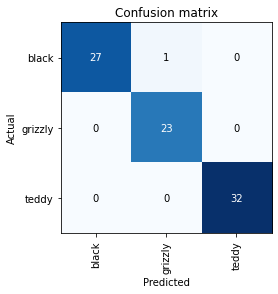

In [43]:
from fastai.vision import learner
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

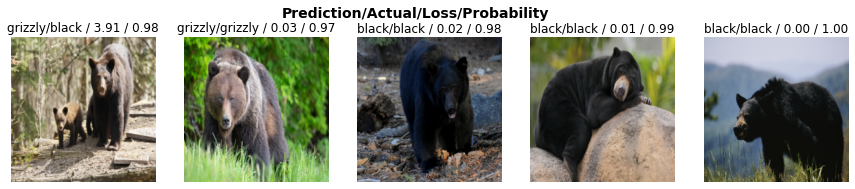

In [44]:
interp.plot_top_losses(5, nrows=1)

In [50]:
from fastai.vision.widgets import * 

In [51]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [52]:
for idx in cleaner.delete():
  cleaner.fns[idx].unlink()

In [53]:
learn.export()

In [54]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [55]:
learn_info = load_learner(path/'export.pkl')

In [58]:
learn_info.predict('images/grizzly.jpg')

('grizzly', TensorBase(1), TensorBase([4.3961e-05, 9.9995e-01, 8.5214e-06]))

In [59]:
learn_info.dls.vocab

['black', 'grizzly', 'teddy']

In [60]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [61]:
img = PILImage.create(btn_upload.data[-1])

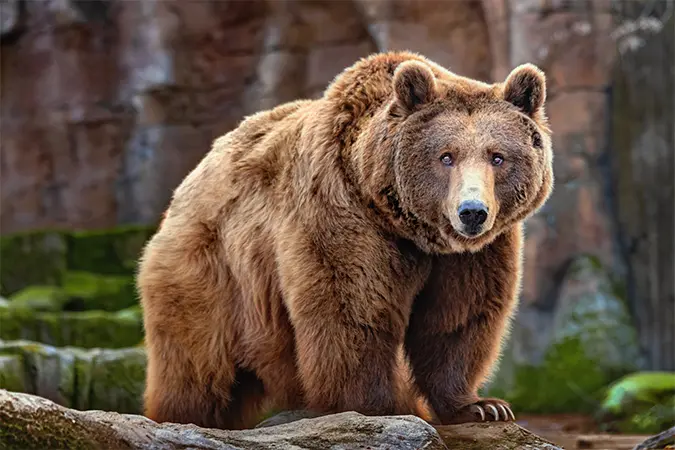

In [62]:
img

In [64]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl:
  display(img.to_thumb(128, 128))
out_pl

Output()

In [65]:
pred, pred_idx, probs = learn_info.predict(img)

In [67]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction; {pred}, probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction; grizzly, probability: 1.0000')

In [69]:
btn_run = widgets.Button(description="Classify")
btn_run

Button(description='Classify', style=ButtonStyle())

In [70]:
def on_click_classify(change):
  img = PILImage.create(btn_upload.data[-1])
  out_pl.clear_output()
  with out_pl:
    display(img.to_thumb(128, 128))
    pred, pred_idx, probs = learn_info.predict(img)
    lbl_pred.value = f'Prediction: {pred}, Probability: {probs[pred_idx]:.4f}'

In [71]:
btn_run.on_click(on_click_classify)

In [72]:
VBox([widgets.Label('Select your bear!'),
     btn_upload, btn_run, out_pl, lbl_pred])

In [73]:
!pip install voila

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 31.5 MB/s 
     |████████████████████████████████| 561 kB 62.5 MB/s 
     |████████████████████████████████| 112 kB 76.8 MB/s 
     |████████████████████████████████| 70 kB 9.9 MB/s 
     |████████████████████████████████| 54 kB 2.6 MB/s 
     |████████████████████████████████| 344 kB 49.4 MB/s 
     |████████████████████████████████| 132 kB 41.2 MB/s 
     |████████████████████████████████| 423 kB 27.4 MB/s 
     |████████████████████████████████| 54 kB 2.7 MB/s 
     |████████████████████████████████| 80 kB 7.8 MB/s 
     |████████████████████████████████| 133 kB 50.9 MB/s 
  Attempting uninstall: tornado
    Found existing installation: tornado 5.1.1
    Uninstalling tornado-5.1.1:
      Successfully uninstalled tornado-5.1.1
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 5.3.5
    Uninstalling jupyt

In [74]:
!jupyter serverextension enable voila --sys-prefix

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
      voila  OK
